# Downstream analysis on spatial multi-omics data of human gastric cancer

In this tutorial, we will perform downstream analysis of spatial multi-omics data from the human gastric cancer, including identification of MCC flow, group-level MCC, MCC pattern, MCC remodelling in receiver cells.

In [1]:
# Importing packages
import os
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
# Setting your work dictionary
os.chdir("/home/project/metachat_packages/")

In [3]:
import sys
sys.path.append("/home/project/metachat_packages/MetaChat-main/")
import metachat_new as mc

## Import MetaChat results

In [4]:
adata = sc.read('datasets/human_gastric_cancer/metachat_result.h5ad')

## Compute group-level MCC of all pairs and all pathways

To summarize MCC patterns between any two group types, we need to compute group-level MCCs across all metabolite–sensor pairs and all pathways.

In [5]:
# extract all_ms_pairs
df_metasen_filtered = adata.uns['df_metasen_filtered']
all_ms_pairs = (df_metasen_filtered['HMDB.ID'] + '-' + df_metasen_filtered['Sensor.Gene']).tolist()

In [6]:
# extract all_metapathways
Metapathway_data = df_metasen_filtered["Metabolite.Pathway"].copy()
Metapathway_list = []
for item in Metapathway_data:
    split_items = item.split('; ')
    Metapathway_list.extend(split_items)
all_metapathways = np.unique(Metapathway_list).tolist()
all_metapathways = [x for x in all_metapathways if x != 'nan']

The original output of MetaChat provides MCC signals for each individual metabolite–sensor pair.
Here, we use `mc.tl.summary_communication` to summarize the overall MCC activity associated with specific metabolic pathway, aggregating their communication strengths across all corresponding sensors.

In [7]:
mc.tl.summary_communication(adata = adata,
                            database_name = 'MetaChatDB',
                            sum_metapathways = all_metapathways)

Meanwhile, all metabolite–sensor pairs and pathways can be processed together in parallel using the `use_parallel=True` option. Here, we use the non-spatial version of the statistical test for all metabolite–sensor pairs, since only the group-level MCC scores (rather than p-values) are needed in downstream analyses, allowing faster computation while retaining the same information content.

In [9]:
mc.tl.communication_group(adata = adata,
                          database_name = 'MetaChatDB',
                          group_name = "tissue_type",
                          sum_ms_pairs = all_ms_pairs,
                          n_permutations = 100,
                          use_parallel = True,
                          n_jobs = 100)

  Computing group-level MCC: 100%|██████████| 610/610 [00:19<00:00, 31.65it/s]


In [10]:
mc.tl.communication_group_spatial(adata = adata,
                                  database_name = 'MetaChatDB',
                                  group_name = "tissue_type",
                                  sum_metapathways = all_metapathways,
                                  n_permutations = 100,
                                  use_parallel = True,
                                  n_jobs = 100)

  Computing group-level MCC: 100%|██████████| 8100/8100 [11:08<00:00, 12.11it/s]


We can first visualize the group-level MCC across all signaling pairs.

Text(0.5, 1.0, 'Group-level MCC')

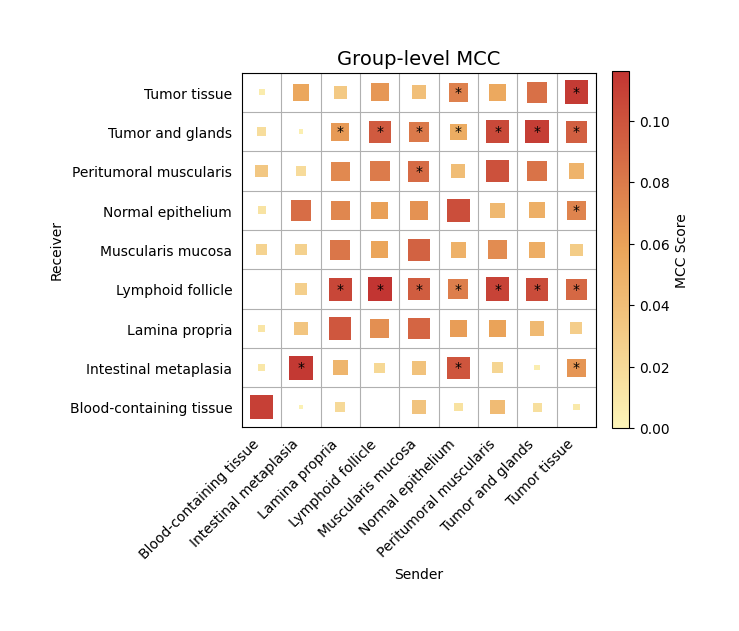

In [11]:
fig, ax = plt.subplots(1, 1, figsize=(5,5))
mc.pl.plot_group_communication_heatmap(adata = adata,
                                       database_name = 'MetaChatDB',
                                       group_name = "tissue_type",
                                       cmap = 'red',
                                       permutation_spatial = True,
                                       ax = ax)
ax.set_title('Group-level MCC', fontsize=14)

We can observe significant interactions from the tumor tissue toward the surrounding gland regions.

## Summary MCC pattern from tumor tissue to glands

In this step, we summarize the MCC pattern specifically from the tumor tissue to the surrounding glands.
By specifying the sender and receiver groups, the `mc.tl.summary_pathway` function integrates all metabolite–sensor pairs within each pathway and evaluates their overall contributions.

In [12]:
sender_group = "Tumor tissue"
receiver_group = "Tumor and glands"
metapathway_rank, senspathway_rank, ms_result, metapathway_pair_contributions = mc.tl.summary_pathway(
    adata = adata,
    database_name = 'MetaChatDB',
    group_name = "tissue_type",
    sender_group = sender_group,
    receiver_group = receiver_group,
    permutation_spatial = True)

The function mc.tl.summary_pathway() outputs four complementary tables that summarize group-level MCC at multiple biological levels:  

•	`metapathway_rank` lists metabolite pathways ranked by their overall communication score, indicating which metabolic routes most contribute to the MCC between the selected sender and receiver groups.  

•	`senspathway_rank` ranks sensor-associated signaling pathways by their Rankscore, reflecting how strongly each receptor or signaling cascade is involved in receiving or responding to metabolite-mediated communication.  

•	`ms_result` is a matrix showing pairwise communication scores between each metabolite pathway and sensor pathway, capturing how specific metabolic routes couple to particular receptor signaling modules.  

•	`metapathway_pair_contributions` provides detailed contributions from individual metabolite–sensor pairs within each metabolite pathway, allowing fine-grained inspection of which molecular interactions drive the observed pathway-level MCC.  


In [ ]:
sender_group = "Tumor tissue"
receiver_group = "Tumor and glands"
mc.pl.plot_summary_pathway(ms_result = ms_result,
                           metapathway_rank = metapathway_rank,
                           senspathway_rank = senspathway_rank,
                           plot_metapathway_index = [2,3,5,7,8],
                           plot_senspathway_index = [0,1,3,5,16],
                           figsize = (8,4))

Visualize the spatial distribution of MCC flow and signaling strength for the `Glycolysis / Gluconeogenesis` pathway.

In [27]:
metapathway_name = "Glycolysis_Gluconeogenesis"
mc.tl.communication_flow(adata = adata,
                         database_name = 'MetaChatDB',
                         sum_metapathways = [metapathway_name],
                         k = 10)

AttributeError: 'dict' object has no attribute 'lower'

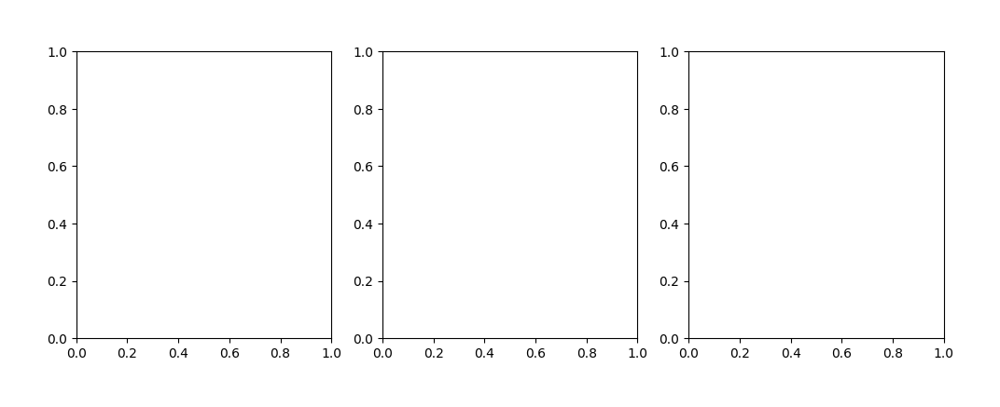

In [28]:
fig, ax = plt.subplots(1, 3, figsize=(12,4))
pl1 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metapathway_name = metapathway_name,
                                    plot_method = 'grid',
                                    background = 'group',
                                    group_name = 'tissue_type',
                                    summary = 'receiver',
                                    ndsize = 3,
                                    largest_arrow = 0.05,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.5,
                                    title = 'MCC flow',   
                                    ax = ax[0])
ax[0].set_box_aspect(1)

pl2 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metapathway_name = metapathway_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    cmap = 'YlOrRd',
                                    ndsize = 5,
                                    largest_arrow = 0.05,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC sent signals',   
                                    ax = ax[1])
ax[1].set_box_aspect(1)

pl3 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metapathway_name = metapathway_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'receiver',
                                    cmap = 'YlGn',
                                    ndsize = 5,
                                    largest_arrow = 0.05,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC received signals',   
                                    ax = ax[2])
ax[2].set_box_aspect(1)

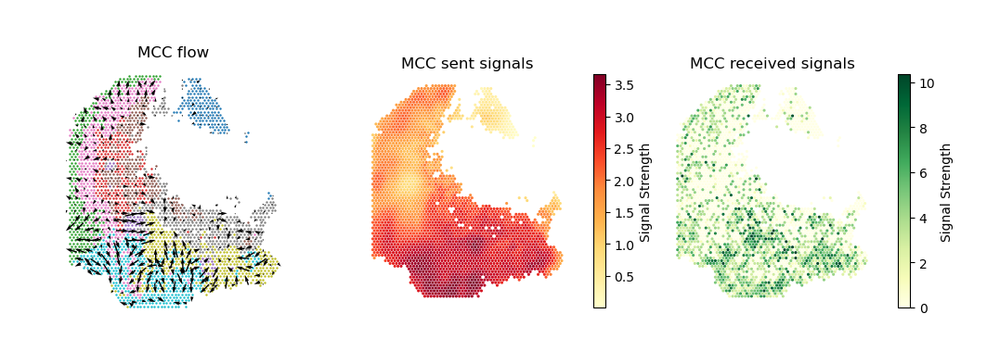

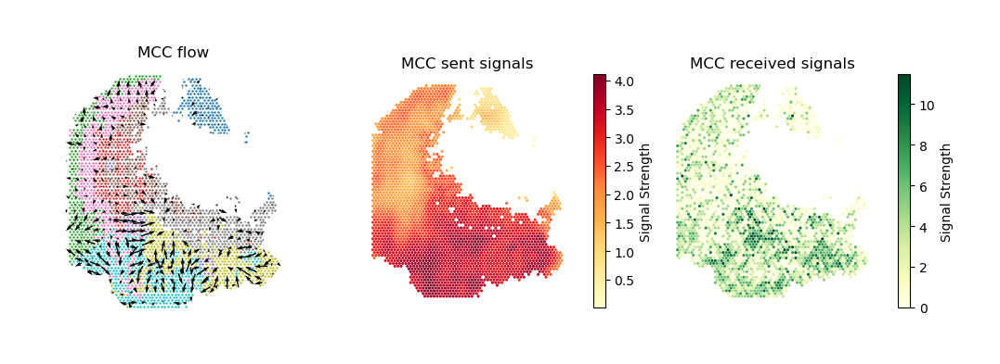

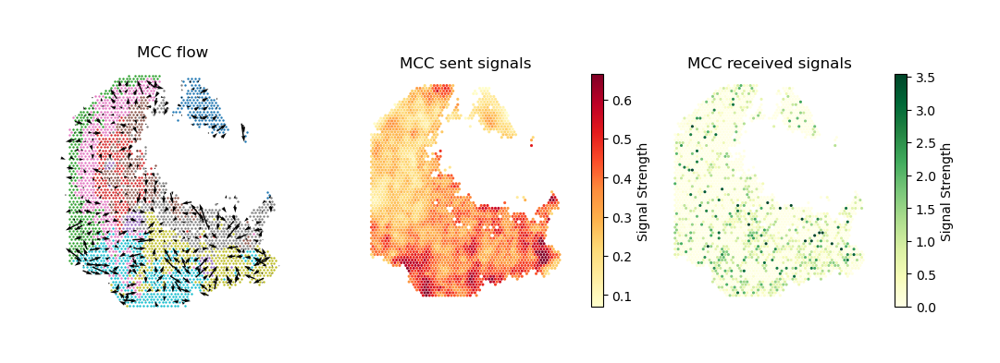

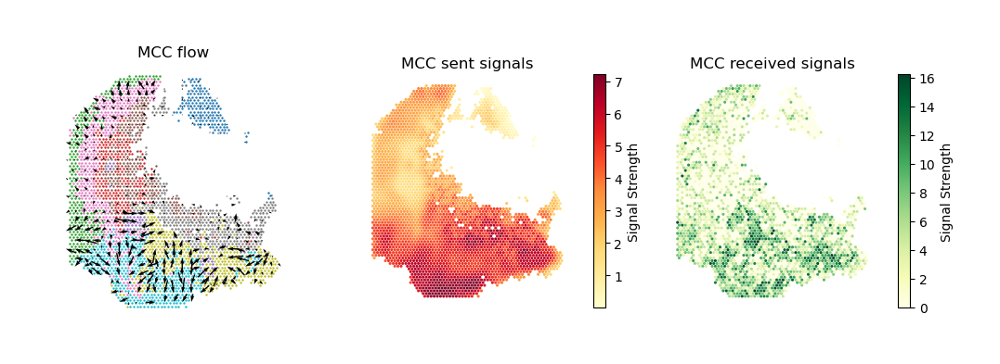

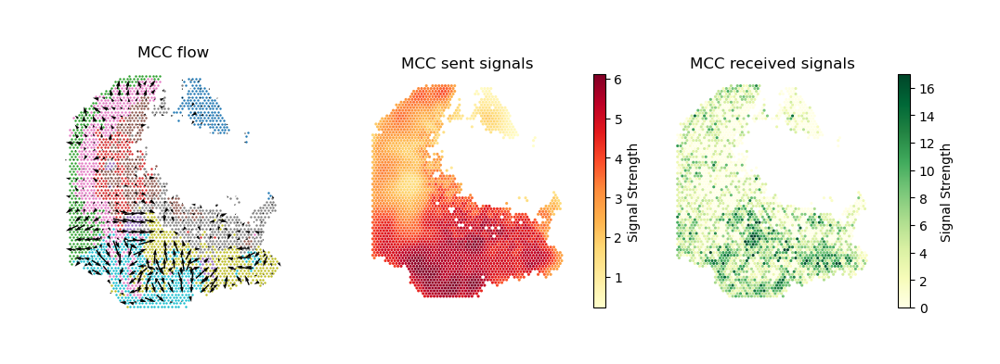

...

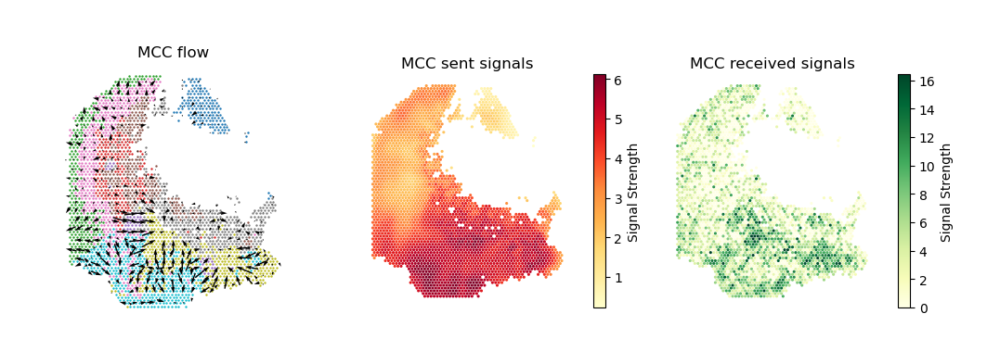

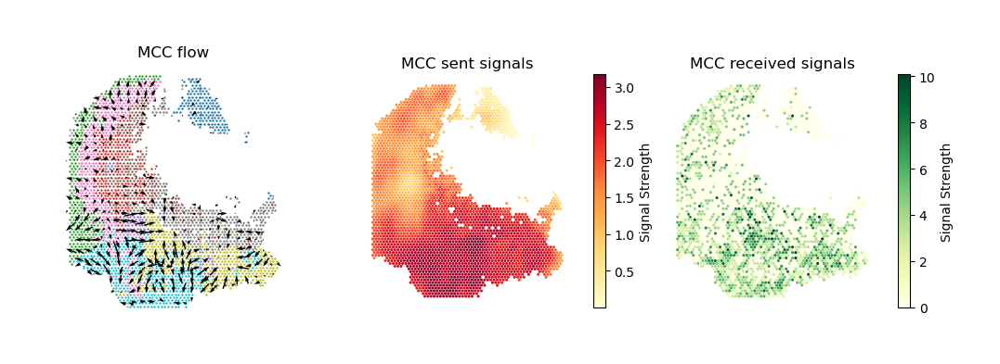

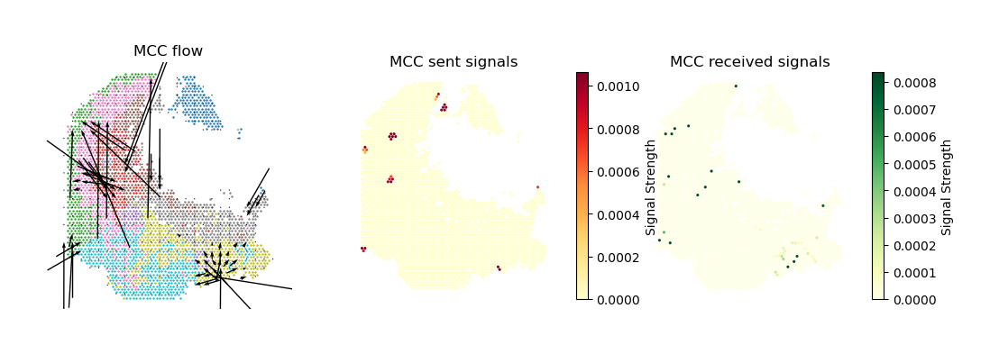

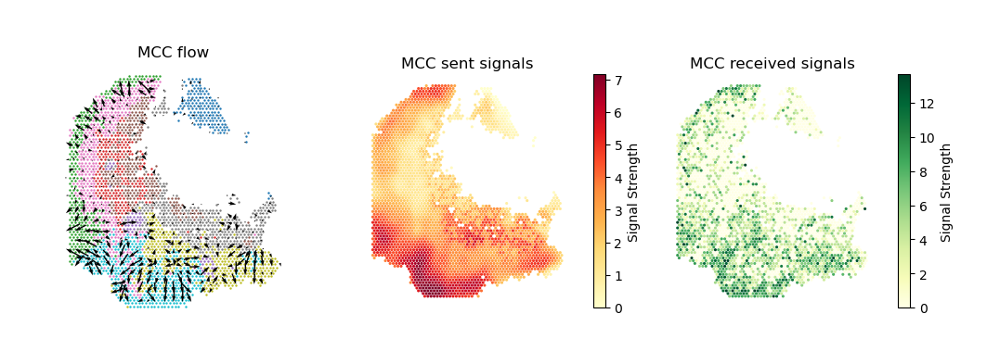

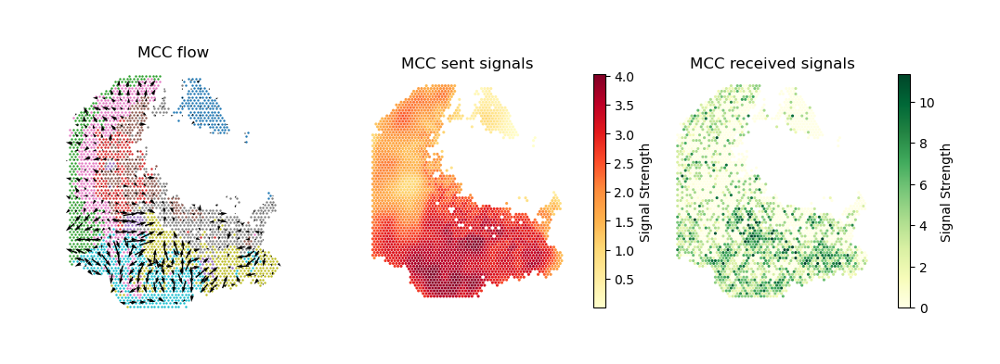

In [ ]:

    fig, ax = plt.subplots(1, 3, figsize=(12,4))
    pl1 = mc.pl.plot_communication_flow(adata = adata, 
                                        database_name = 'MetaChatDB',
                                        metapathway_name = metapathway_name,
                                        plot_method = 'grid',
                                    background = 'group',
                                    group_name = 'tissue_type',
                                    summary = 'receiver',
                                    ndsize = 3,
                                    largest_arrow = 0.05,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.5,
                                    title = 'MCC flow',   
                                    ax = ax[0])
    ax[0].set_box_aspect(1)

    pl2 = mc.pl.plot_communication_flow(adata = adata, 
                                        database_name = 'MetaChatDB',
                                        metapathway_name = metapathway_name,
                                        plot_method = None,
                                        background = 'summary',
                                        group_name = 'tissue_type',
                                        summary = 'sender',
                                        cmap = 'YlOrRd',
                                        ndsize = 5,
                                        largest_arrow = 0.05,
                                        normalize_v_quantile = 0.995,
                                        grid_density = 0.4,
                                        title = 'MCC sent signals',   
                                        ax = ax[1])
    ax[1].set_box_aspect(1)

    pl3 = mc.pl.plot_communication_flow(adata = adata, 
                                        database_name = 'MetaChatDB',
                                        metapathway_name = metapathway_name,
                                        plot_method = None,
                                        background = 'summary',
                                        group_name = 'tissue_type',
                                        summary = 'receiver',
                                        cmap = 'YlGn',
                                        ndsize = 5,
                                        largest_arrow = 0.05,
                                        normalize_v_quantile = 0.995,
                                        grid_density = 0.4,
                                        title = 'MCC received signals',   
                                        ax = ax[2])
    ax[2].set_box_aspect(1)
    fig.savefig(f"plot/MCC_flow_{metapathway_name}_20251009.pdf")

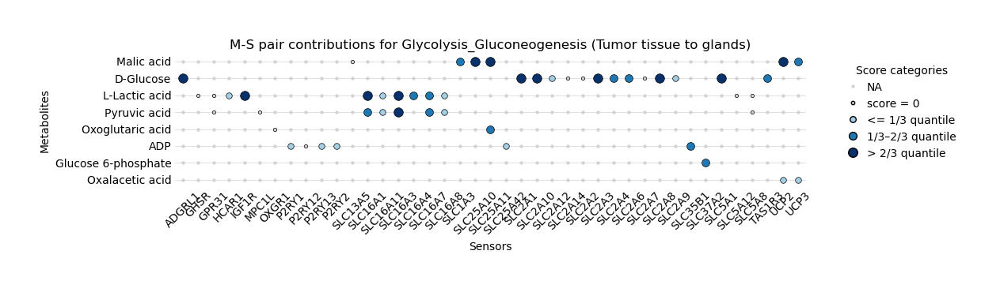

In [15]:
pathway_name = "Glycolysis_Gluconeogenesis"
mc.pl.plot_metapathway_pair_contribution_bubbleplot(pathway_pair_contributions = metapathway_pair_contributions_TG,
                                                 pathway_name = pathway_name,
                                                 cmap = "blue",
                                                 smallest_size = 10,
                                                 figsize=(12, 3),
                                                 plot_title = f"M-S pair contributions for {pathway_name} (Tumor tissue to glands)",
                                                 plot_savepath = f"plot/metapathway_pair_contribution_bubbleplot_{pathway_name}.pdf")

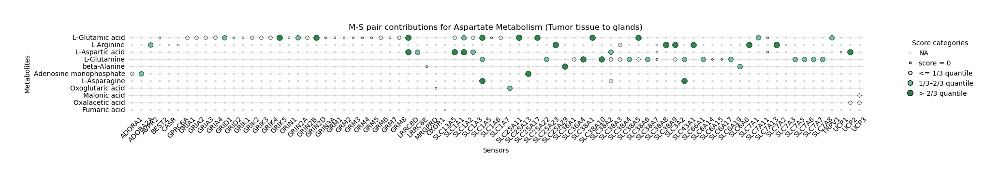

In [ ]:
pathway_name = "Aspartate Metabolism"
mc.pl.plot_metapathway_pair_contribution_bubbleplot(pathway_pair_contributions = metapathway_pair_contributions_TG,
                                                 pathway_name = pathway_name,
                                                 cmap = "green",
                                                 smallest_size = 10,
                                                 figsize=(20, 3),
                                                 plot_title = f"M-S pair contributions for {pathway_name} (Tumor tissue to glands)",
                                                 plot_savepath = f"plot/metapathway_pair_contribution_bubbleplot_{pathway_name}.pdf")

#### To tumor tissue

In [40]:
sender_group = "Tumor tissue"
receiver_group = "Tumor tissue"
metapathway_rank_TT, senspathway_rank_TT, ms_result_TT, metapathway_pair_contributions_TT = mc.tl.summary_pathway(adata = adata,
                                                                      database_name = 'MetaChatDB',
                                                                      group_name = "tissue_type",
                                                                      sender_group = sender_group,
                                                                      receiver_group = receiver_group,
                                                                      permutation_spatial = True)
metapathway_rank_TT.to_csv(f"results/metapathway_{sender_group}_{receiver_group}.csv")
senspathway_rank_TT.to_csv(f"results/senspathway_{sender_group}_{receiver_group}.csv")

In [41]:
sender_group = "Tumor tissue"
receiver_group = "Tumor tissue"
mc.pl.plot_summary_pathway(ms_result = ms_result_TT,
                           metapathway_rank = metapathway_rank_TT,
                           senspathway_rank = senspathway_rank_TT,
                           plot_metapathway_index = list(range(10)),
                           plot_senspathway_index = list(range(10)),
                           figsize = (8,5),
                           plot_savepath = f"plot/summary_pathway_{sender_group}_{receiver_group}_top10.pdf"
                           )

### MCC remodelling in receiver cells

In [43]:
adata_raw = sc.read("data/processed/RNA_annotated.h5ad")

Glycolysis_Gluconeogenesis

In [11]:
metapathway_name = 'Glycolysis_Gluconeogenesis'
df_deg, df_yhat = mc.tl.communication_responseGenes(adata = adata,
                                                    adata_raw = adata_raw,
                                                    database_name = 'MetaChatDB',
                                                    metapathway_name = metapathway_name,
                                                    group_name = 'tissue_type',
                                                    summary = 'receiver')

  0%|          | 0/100 [00:00<?, ?/s]

  |                                                  | 0 % ~calculating   |+                                                 | 1 % ~08m 41s       |+                                                 | 2 % ~08m 27s       |++                                                | 3 % ~07m 56s       |++                                                | 4 % ~07m 45s       |+++                                               | 5 % ~07m 34s       |+++                                               | 6 % ~07m 24s       |++++                                              | 7 % ~07m 20s       |++++                                              | 8 % ~07m 15s       |+++++                                             | 9 % ~07m 09s       |+++++                                             | 10% ~07m 12s       |++++++                                            | 11% ~07m 07s       |++++++                                            | 12% ~08m 02s       |+++++++                                           | 13% ~07m 

In [12]:
# Save results
import pickle
deg_result = {"df_deg": df_deg, "df_yhat": df_yhat}
with open("results/responseGenes_" + metapathway_name + "_all.pkl", 'wb') as handle:
    pickle.dump(deg_result, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [16]:
import pickle
metapathway_name = 'Glycolysis_Gluconeogenesis'
with open("results/responseGenes_" + metapathway_name + "_all.pkl", 'rb') as file:
    deg_result = pickle.load(file)
df_deg = deg_result["df_deg"]
df_yhat = deg_result["df_yhat"]

import re
pattern = re.compile(r'^(RPL|RPS|MT\-|NDU|CO|ATP5)')
mask = ~df_deg.index.to_series().str.match(pattern)
df_deg = df_deg[mask].copy()

df_deg_clus, df_yhat_clus = mc.tl.communication_responseGenes_cluster(df_deg.iloc[:,:3], df_yhat, deg_clustering_res=0.3)

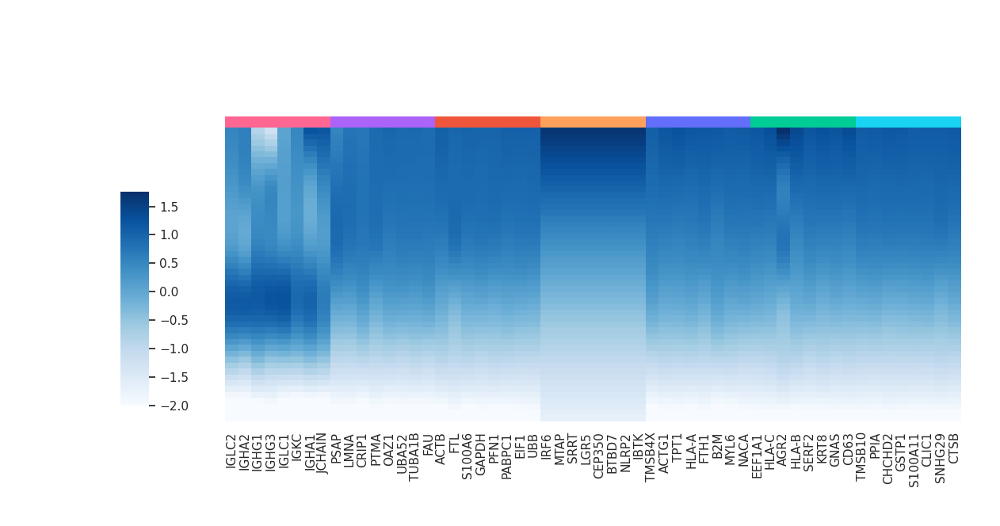

In [17]:
mc.pl.plot_communication_responseGenes(df_deg = df_deg_clus,
                                       df_yhat = df_yhat_clus,
                                       top_ngene_per_cluster = 8,
                                       colormap = 'Blues',
                                       color_range = (-2,2),
                                       font_scale = 1,
                                       figsize = (12,6),
                                       return_genes = False,
                                       plot_savepath = f'plot/response_gene_heatmap_{metapathway_name}_all.pdf')

In [18]:
kegg_result_subgroup = mc.tl.communication_responseGenes_keggEnrich(gene_list = df_deg[df_deg['pvalue'] < 0.05].index.tolist(),
                                                         gene_sets = "KEGG_2021_Human",
                                                         organism = "Human")

In [19]:
kegg_result_subgroup.to_csv("results/responseGenes_keggEnrich_" + metapathway_name + "_all.csv")

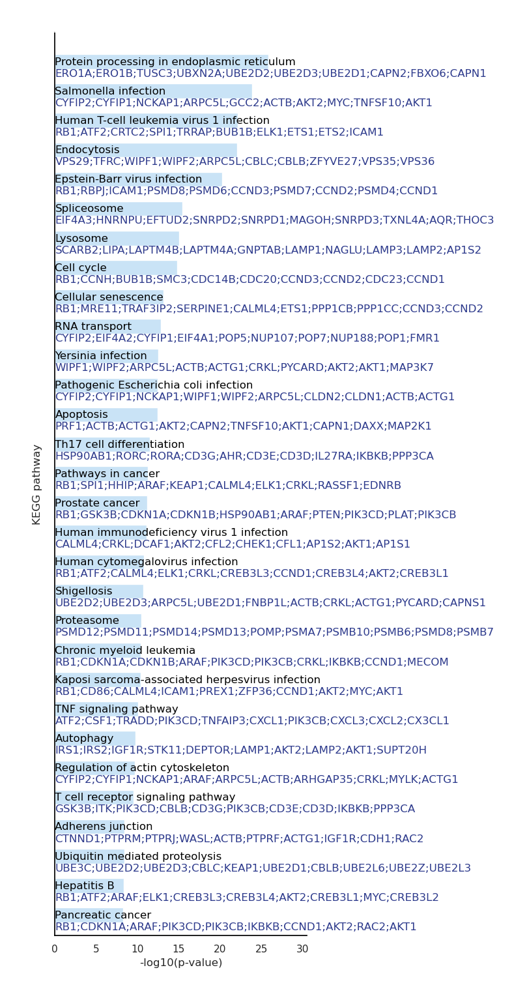

In [55]:
mc.pl.plot_communication_responseGenes_keggEnrich(df_result = kegg_result_subgroup,
                                                  show_term_order = range(30),
                                                  cmap = 'blue',
                                                  maxshow_gene = 10,
                                                  organism = "Human",
                                                  figsize = (5,18),
                                                  plot_savepath = f'plot/kegg_barplot_{metapathway_name}_fullpathway.pdf')

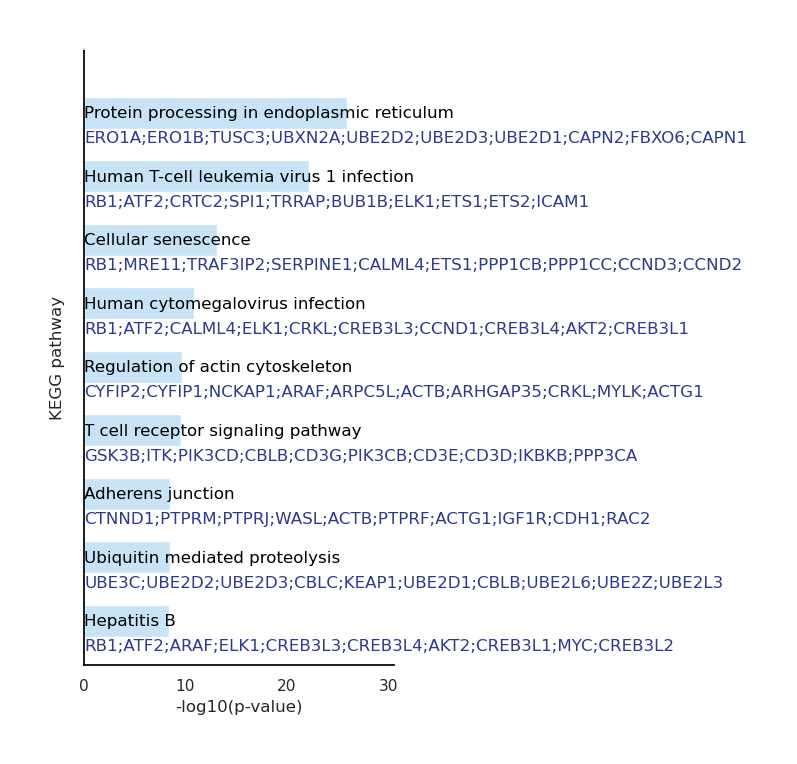

In [56]:
mc.pl.plot_communication_responseGenes_keggEnrich(df_result = kegg_result_subgroup,
                                                  show_term_order = [0,2,8,17,24,25,26,27,28],
                                                  cmap = 'blue',
                                                  maxshow_gene = 10,
                                                  organism = "Human",
                                                  figsize = (4,8),
                                                  plot_savepath = f'plot/kegg_barplot_{metapathway_name}_showpathway.pdf')

Aspartate Metabolism

In [44]:
metapathway_name = 'Aspartate Metabolism'
df_deg, df_yhat = mc.tl.communication_responseGenes(adata = adata,
                                                    adata_raw = adata_raw,
                                                    database_name = 'MetaChatDB',
                                                    metapathway_name = metapathway_name,
                                                    group_name = 'tissue_type',
                                                    summary = 'receiver')

  0%|          | 0/100 [00:00<?, ?/s]

  |                                                  | 0 % ~calculating   |+                                                 | 1 % ~07m 14s       |+                                                 | 2 % ~07m 23s       |++                                                | 3 % ~07m 10s       |++                                                | 4 % ~06m 57s       |+++                                               | 5 % ~06m 44s       |+++                                               | 6 % ~06m 34s       |++++                                              | 7 % ~06m 32s       |++++                                              | 8 % ~06m 31s       |+++++                                             | 9 % ~06m 27s       |+++++                                             | 10% ~06m 27s       |++++++                                            | 11% ~06m 33s       |++++++                                            | 12% ~06m 46s       |+++++++                                           | 13% ~06m 

In [45]:
# Save results
import pickle
deg_result = {"df_deg": df_deg, "df_yhat": df_yhat}
with open("results/responseGenes_" + metapathway_name + "_all.pkl", 'wb') as handle:
    pickle.dump(deg_result, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [46]:
import pickle
metapathway_name = 'Aspartate Metabolism'
with open("results/responseGenes_" + metapathway_name + "_all.pkl", 'rb') as file:
    deg_result = pickle.load(file)
df_deg = deg_result["df_deg"]
df_yhat = deg_result["df_yhat"]

import re
pattern = re.compile(r'^(RPL|RPS|MT\-|NDU|CO|ATP5)')
mask = ~df_deg.index.to_series().str.match(pattern)
df_deg = df_deg[mask].copy()

# Run clustering
df_deg_clus, df_yhat_clus = mc.tl.communication_responseGenes_cluster(
    df_deg.iloc[:, :3],
    df_yhat,
    deg_clustering_res=0.2
)

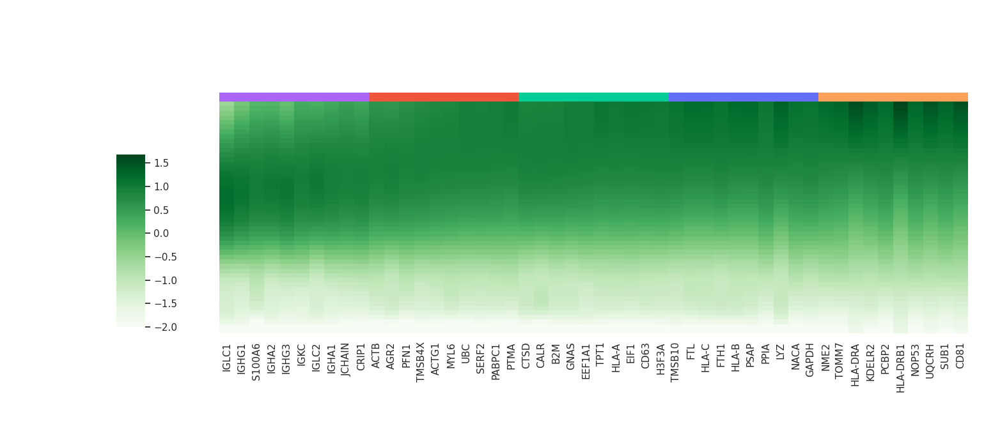

In [48]:
mc.pl.plot_communication_responseGenes(df_deg = df_deg_clus,
                                       df_yhat = df_yhat_clus,
                                       top_ngene_per_cluster = 10,
                                       colormap = 'Greens',
                                       color_range = (-2,2),
                                       font_scale = 1,
                                       figsize = (15,6),
                                       return_genes = False,
                                       plot_savepath = f'plot/response_gene_heatmap_{metapathway_name}_all.pdf')

In [49]:
kegg_result_subgroup = mc.tl.communication_responseGenes_keggEnrich(gene_list = df_deg[df_deg['pvalue'] < 0.05].index.tolist(),
                                                         gene_sets = "KEGG_2021_Human",
                                                         organism = "Human")

In [50]:
kegg_result_subgroup.to_csv("results/responseGenes_keggEnrich_" + metapathway_name + "_all.csv")

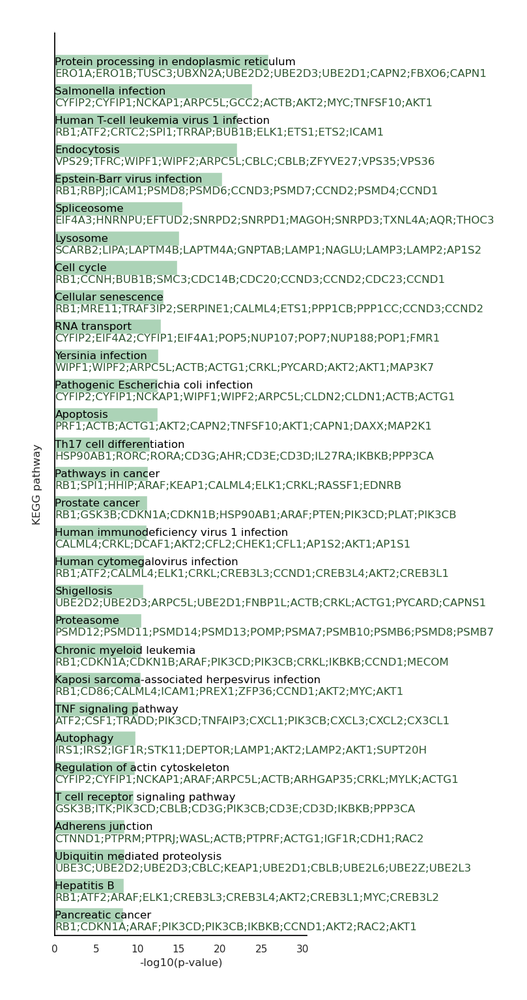

In [59]:
mc.pl.plot_communication_responseGenes_keggEnrich(df_result = kegg_result_subgroup,
                                                  show_term_order = list(range(30)),
                                                  cmap = 'green',
                                                  maxshow_gene = 10,
                                                  organism = "Human",
                                                  figsize = (5,18),
                                                  plot_savepath = f'plot/kegg_barplot_{metapathway_name}_fullpathway.pdf')

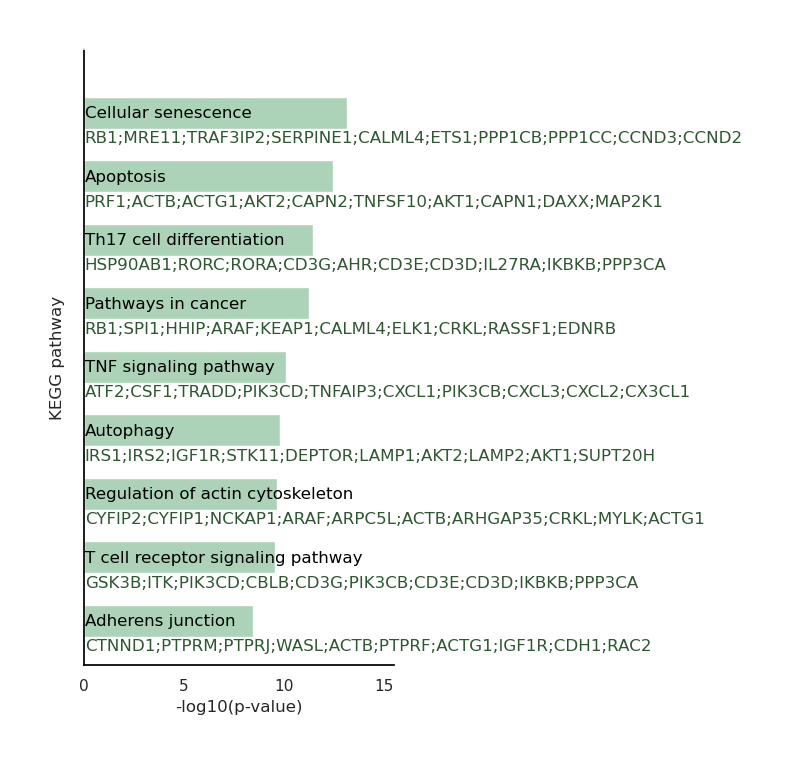

In [60]:
mc.pl.plot_communication_responseGenes_keggEnrich(df_result = kegg_result_subgroup,
                                                  show_term_order = [8,12,13,14,22,23,24,25,26],
                                                  cmap = 'green',
                                                  maxshow_gene = 10,
                                                  organism = "Human",
                                                  figsize = (4,8),
                                                  plot_savepath = f'plot/kegg_barplot_{metapathway_name}_showpathway.pdf')

In [ ]:
mc.pl.plot_summary_pathway(ms_result = ms_result,
                           senspathway_rank = senspathway_rank,
                           plot_senspathway_index = range(5))

In [ ]:
sender_group = "Tumor tissue"
receiver_group = "Tumor and glands"
metapathway_rank, senspathway_rank, ms_result = mc.tl.summary_pathway(adata = adata,
                                                                      database_name = 'MetaChatDB',
                                                                      group_name = "tissue_type",
                                                                      sender_group = sender_group,
                                                                      receiver_group = receiver_group,
                                                                      usenumber_metapathway = 5,
                                                                      permutation_spatial = True)
metapathway_rank.to_csv(f"results/pathway_{sender_group}_{receiver_group}.csv")

In [ ]:
mc.pl.plot_summary_pathway(ms_result = ms_result,
                           senspathway_rank = senspathway_rank,
                           plot_senspathway_index = range(5))

In [ ]:
sender_group = "Tumor tissue"
receiver_group = "Normal epithelium"
metapathway_rank, senspathway_rank, ms_result = mc.tl.summary_pathway(adata = adata,
                                                                      database_name = 'MetaChatDB',
                                                                      group_name = "tissue_type",
                                                                      sender_group = sender_group,
                                                                      receiver_group = receiver_group,
                                                                      usenumber_metapathway = 5,
                                                                      permutation_spatial = True)
metapathway_rank.to_csv(f"results/pathway_{sender_group}_{receiver_group}.csv")

In [ ]:
mc.pl.plot_summary_pathway(ms_result = ms_result,
                           senspathway_rank = senspathway_rank,
                           plot_senspathway_index = range(5))

In [ ]:
sum_metapathways = ['Arginine and proline metabolism', 'Purine metabolism', 'Glycine, serine and threonine metabolism', 'Nitrogen metabolism']
mc.tl.communication_flow(adata = adata,
                         database_name = 'MetaChatDB',
                         sum_metapathways = sum_metapathways,
                         k = 10)

In [ ]:
mc.tl.communication_flow(adata = adata,
                         database_name = 'MetaChatDB',
                         sum_metapathways = all_metapathways,
                         k = 10)
for metapathway_name in all_metapathways:
    fig, ax = plt.subplots(1, 3, figsize=(12,4))
    pl1 = mc.pl.plot_communication_flow(adata = adata, 
                                        database_name = 'MetaChatDB',
                                        metapathway_name = metapathway_name,
                                        plot_method = 'grid',
                                    background = 'group',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    ndsize = 3,
                                    scale = 0.005,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.5,
                                    title = 'MCC flow',   
                                    ax = ax[0])
    ax[0].set_box_aspect(1)

    pl2 = mc.pl.plot_communication_flow(adata = adata, 
                                        database_name = 'MetaChatDB',
                                        metapathway_name = metapathway_name,
                                        plot_method = None,
                                        background = 'summary',
                                        group_name = 'tissue_type',
                                        summary = 'sender',
                                        cmap = 'YlOrRd',
                                        ndsize = 5,
                                        scale = 0.00003,
                                        normalize_v_quantile = 0.995,
                                        grid_density = 0.4,
                                        title = 'MCC sent signals',   
                                        ax = ax[1])
    ax[1].set_box_aspect(1)

    pl3 = mc.pl.plot_communication_flow(adata = adata, 
                                        database_name = 'MetaChatDB',
                                        metapathway_name = metapathway_name,
                                        plot_method = None,
                                        background = 'summary',
                                        group_name = 'tissue_type',
                                        summary = 'receiver',
                                        cmap = 'YlGn',
                                        ndsize = 5,
                                        scale = 0.01,
                                        normalize_v_quantile = 0.995,
                                        grid_density = 0.4,
                                        title = 'MCC received signals',   
                                        ax = ax[2])
    ax[2].set_box_aspect(1)
    fig.savefig(f"plot/MCC_flow_{metapathway_name}.pdf")

In [ ]:
metapathway_name = 'Arginine and proline metabolism'
fig, ax = plt.subplots(1, 3, figsize=(12,4))
pl1 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metapathway_name = metapathway_name,
                                    plot_method = 'grid',
                                    background = 'group',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    ndsize = 3,
                                    scale = 0.005,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.5,
                                    title = 'MCC flow',   
                                    ax = ax[0])
ax[0].set_box_aspect(1)

pl2 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metapathway_name = metapathway_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    cmap = 'YlOrRd',
                                    ndsize = 5,
                                    scale = 0.00003,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC sent signals',   
                                    ax = ax[1])
ax[1].set_box_aspect(1)

pl3 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metapathway_name = metapathway_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'receiver',
                                    cmap = 'YlGn',
                                    ndsize = 5,
                                    scale = 0.01,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC received signals',   
                                    ax = ax[2])
ax[2].set_box_aspect(1)
fig.savefig(f"plot/MCC_flow_{metapathway_name}.pdf")

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(5,5))
mc.pl.plot_group_communication_heatmap(adata = adata,
                                       database_name = 'MetaChatDB',
                                       group_name = "tissue_type",
                                       metapathway_name = metapathway_name,
                                       cmap = 'red',
                                       permutation_spatial = True,
                                       ax = ax)
ax.set_title(f'Group-level MCC of {metapathway_name}', fontsize=14)

In [ ]:
metapathway_name = 'Purine metabolism'
fig, ax = plt.subplots(1, 3, figsize=(12,4))
pl1 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metapathway_name = metapathway_name,
                                    plot_method = 'grid',
                                    background = 'group',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    ndsize = 3,
                                    scale = 0.005,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.5,
                                    title = 'MCC flow',   
                                    ax = ax[0])
ax[0].set_box_aspect(1)

pl2 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metapathway_name = metapathway_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    cmap = 'YlOrRd',
                                    ndsize = 5,
                                    scale = 0.00003,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC sent signals',   
                                    ax = ax[1])
ax[1].set_box_aspect(1)

pl3 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metapathway_name = metapathway_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'receiver',
                                    cmap = 'YlGn',
                                    ndsize = 5,
                                    scale = 0.01,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC received signals',   
                                    ax = ax[2])
ax[2].set_box_aspect(1)
fig.savefig(f"plot/MCC_flow_{metapathway_name}.pdf")

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(5,5))
mc.pl.plot_group_communication_heatmap(adata = adata,
                                       database_name = 'MetaChatDB',
                                       group_name = "tissue_type",
                                       metapathway_name = metapathway_name,
                                       cmap = 'red',
                                       permutation_spatial = True,
                                       ax = ax)
ax.set_title(f'Group-level MCC of {metapathway_name}', fontsize=14)

In [ ]:
metapathway_name = 'Glycine, serine and threonine metabolism'
fig, ax = plt.subplots(1, 3, figsize=(12,4))
pl1 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metapathway_name = metapathway_name,
                                    plot_method = 'grid',
                                    background = 'group',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    ndsize = 3,
                                    scale = 0.005,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.5,
                                    title = 'MCC flow',   
                                    ax = ax[0])
ax[0].set_box_aspect(1)

pl2 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metapathway_name = metapathway_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    cmap = 'YlOrRd',
                                    ndsize = 5,
                                    scale = 0.00003,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC sent signals',   
                                    ax = ax[1])
ax[1].set_box_aspect(1)

pl3 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metapathway_name = metapathway_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'receiver',
                                    cmap = 'YlGn',
                                    ndsize = 5,
                                    scale = 0.01,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC received signals',   
                                    ax = ax[2])
ax[2].set_box_aspect(1)
fig.savefig(f"plot/MCC_flow_{metapathway_name}.pdf")

In [ ]:
metapathway_name = 'Nitrogen metabolism'
fig, ax = plt.subplots(1, 3, figsize=(12,4))
pl1 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metapathway_name = metapathway_name,
                                    plot_method = 'grid',
                                    background = 'group',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    ndsize = 3,
                                    scale = 0.005,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.5,
                                    title = 'MCC flow',   
                                    ax = ax[0])
ax[0].set_box_aspect(1)

pl2 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metapathway_name = metapathway_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    cmap = 'YlOrRd',
                                    ndsize = 5,
                                    scale = 0.00003,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC sent signals',   
                                    ax = ax[1])
ax[1].set_box_aspect(1)

pl3 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metapathway_name = metapathway_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'receiver',
                                    cmap = 'YlGn',
                                    ndsize = 5,
                                    scale = 0.01,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC received signals',   
                                    ax = ax[2])
ax[2].set_box_aspect(1)
fig.savefig(f"plot/MCC_flow_{metapathway_name}.pdf")

In [ ]:
sum_metabolites = ['HMDB0000162', 'HMDB0000517', 'HMDB0001234']
mc.tl.summary_communication(adata = adata,
                            database_name = 'MetaChatDB',
                            sum_metabolites = sum_metabolites)
mc.tl.communication_flow(adata = adata,
                         database_name = 'MetaChatDB',
                         sum_metabolites = sum_metabolites,
                         k = 10)

In [ ]:
metabolite_name = 'HMDB0000162'
fig, ax = plt.subplots(1, 3, figsize=(12,4))
pl1 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metabolite_name = metabolite_name,
                                    plot_method = 'grid',
                                    background = 'group',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    ndsize = 3,
                                    scale = 0.005,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.5,
                                    title = 'MCC flow',   
                                    ax = ax[0])
ax[0].set_box_aspect(1)

pl2 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metabolite_name = metabolite_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    cmap = 'YlOrRd',
                                    ndsize = 5,
                                    scale = 0.00003,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC sent signals',   
                                    ax = ax[1])
ax[1].set_box_aspect(1)

pl3 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metabolite_name = metabolite_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'receiver',
                                    cmap = 'YlGn',
                                    ndsize = 5,
                                    scale = 0.01,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC received signals',   
                                    ax = ax[2])
ax[2].set_box_aspect(1)
fig.savefig(f"plot/MCC_flow_{metabolite_name}.pdf")

In [ ]:
metabolite_name = 'HMDB0000517'
fig, ax = plt.subplots(1, 3, figsize=(12,4))
pl1 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metabolite_name = metabolite_name,
                                    plot_method = 'grid',
                                    background = 'group',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    ndsize = 3,
                                    scale = 0.002,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.5,
                                    title = 'MCC flow',   
                                    ax = ax[0])
ax[0].set_box_aspect(1)

pl2 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metabolite_name = metabolite_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    cmap = 'YlOrRd',
                                    ndsize = 5,
                                    scale = 0.00003,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC sent signals',   
                                    ax = ax[1])
ax[1].set_box_aspect(1)

pl3 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metabolite_name = metabolite_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'receiver',
                                    cmap = 'YlGn',
                                    ndsize = 5,
                                    scale = 0.01,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC received signals',   
                                    ax = ax[2])
ax[2].set_box_aspect(1)
fig.savefig(f"plot/MCC_flow_{metabolite_name}.pdf")

In [ ]:
metabolite_name = 'HMDB0001234'
fig, ax = plt.subplots(1, 3, figsize=(12,4))
pl1 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metabolite_name = metabolite_name,
                                    plot_method = 'grid',
                                    background = 'group',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    ndsize = 3,
                                    scale = 0.005,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.5,
                                    title = 'MCC flow',   
                                    ax = ax[0])
ax[0].set_box_aspect(1)

pl2 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metabolite_name = metabolite_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'sender',
                                    cmap = 'YlOrRd',
                                    ndsize = 5,
                                    scale = 0.00003,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC sent signals',   
                                    ax = ax[1])
ax[1].set_box_aspect(1)

pl3 = mc.pl.plot_communication_flow(adata = adata, 
                                    database_name = 'MetaChatDB',
                                    metabolite_name = metabolite_name,
                                    plot_method = None,
                                    background = 'summary',
                                    group_name = 'tissue_type',
                                    summary = 'receiver',
                                    cmap = 'YlGn',
                                    ndsize = 5,
                                    scale = 0.01,
                                    normalize_v_quantile = 0.995,
                                    grid_density = 0.4,
                                    title = 'MCC received signals',   
                                    ax = ax[2])
ax[2].set_box_aspect(1)
fig.savefig(f"plot/MCC_flow_{metabolite_name}.pdf")